In [6]:
# import folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
import json
import re
import geojson
from geojson import MultiLineString
from geomet import wkt
from folium.plugins import HeatMap, MarkerCluster
from branca.element import Template, MacroElement
import itertools
import copy
import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'shapely'

In [65]:
df_boundary = pd.read_csv("City_Boundary_layer.csv")
df_speed = pd.read_csv("Speed_Limits.csv")
df_volumes = pd.read_csv("Traffic_Volumes_for_2018.csv")
df_cameras = pd.read_csv("Traffic_Camera_Locations.csv")
df_signals = pd.read_csv("Traffic_Signals.csv")
df_signs = pd.read_csv("Traffic_Signs.csv")

# Showing The Boundary

In [66]:
m = folium.Map(location=[51.044270, -114.062019])

# parse the multiline string as geojson
boundary_json = json.dumps(wkt.loads(df_boundary['the_geom'][0]))
folium.GeoJson(boundary_json).add_to(m)
m

In [67]:
# clean up string to get boundary coordinates
df_boundary['the_geom'] = df_boundary['the_geom'].map(lambda x: x.lstrip('POLYGON (('))

df_boundary.the_geom.apply(pd.Series)

boundarySplit = df_boundary['the_geom'].str.split(',')

x = boundarySplit[0]

# get a list of latitude, longiitude points 
lat = [float(y.split()[1].strip('))')) for y in x]
long = [float(y.split()[0].strip('))')) for y in x]

# Get the corners of the boundary rectangle
endlat = max(lat)
startlat = min(lat)
startlong = min(long)
endlong = max(long)

In [68]:
m1 = folium.Map(location=[51.044270, -114.062019])
folium.vector_layers.Polygon([[startlat, endlong], [endlat, endlong], [endlat, startlong],[startlat, startlong]]).add_to(m1)
m1

## Showing the Grids

In [69]:
lowerLeft = [startlat, startlong]
upperRight = [endlat, endlong]

def get_geojson_grid(upper_right, lower_left, n, m):
    """Returns a grid of geojson rectangles, and computes the exposure in each section of the grid based on the vessel data.
    Parameters
    ----------
    upper_right: array_like
        The upper right hand corner of "grid of grids" (the default is the upper right hand [lat, lon] of the USA).
    lower_left: array_like
        The lower left hand corner of "grid of grids"  (the default is the lower left hand [lat, lon] of the USA).
    n: integer
        The number of rows/columns in the (n,n) grid.
    list
        List of "geojson style" dictionary objects   
    """
    all_boxes = []

    lat_steps = np.linspace(lower_left[0], upper_right[0], n+1)
    lon_steps = np.linspace(lower_left[1], upper_right[1], m+1)

    lat_stride = lat_steps[1] - lat_steps[0]
    lon_stride = lon_steps[1] - lon_steps[0]

    for lat in lat_steps[:-1]:
        for lon in lon_steps[:-1]:
            # Define dimensions of box in grid
            upper_left = [lon, lat + lat_stride]
            upper_right = [lon + lon_stride, lat + lat_stride]
            lower_right = [lon + lon_stride, lat]
            lower_left = [lon, lat]
            
            #make each box a Polygon object
            box = Polygon([lower_left, lower_right, upper_right, upper_left])
    
          
            all_boxes.append(box)

    return all_boxes

In [70]:
grid = get_geojson_grid(upperRight, lowerLeft, 10, 10)

for i in grid:
    

    
    gj = folium.GeoJson(i, style_function=lambda x: {
                                                                    'color':"black",
                                                                    'weight': 1,
#                                                                     'dashArray': '5,5',
                                                                    'fillOpacity': 0.01,
                                                                        })
    
    m1.add_child(gj)
m1

## Speed Visualization

In [71]:
# color dictionary to define colors for each speed limit
color_dict= {
    20:"#d0d1e6",
    30:"#ece7f2",
    35:"#fff7fb",
    40:"#fff7ec",
    45:"#fee8c8",
    50:"#fdd49e",
    60:"#fdbb84",
    70:"#fc8d59",
    80:"#ef6548",
    90:"#d7301f",
    100:"#b30000",
    110:"#7f0000", 
}

# legend display
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Speed Limits</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#d0d1e6;opacity:0.7;'></span>20</li>
    <li><span style='background:#ece7f2;opacity:0.7;'></span>30</li>
    <li><span style='background:#fff7fb;opacity:0.7;'></span>35</li>
    <li><span style='background:#fff7ec;opacity:0.7;'></span>40</li>
    <li><span style='background:#fff7fb;opacity:0.7;'></span>45</li>
    <li><span style='background:#fdd49e;opacity:0.7;'></span>50</li>
    <li><span style='background:#fdbb84;opacity:0.7;'></span>60</li>
    <li><span style='background:#fc8d59;opacity:0.7;'></span>70</li>
    <li><span style='background:#ef6548;opacity:0.7;'></span>80</li>
    <li><span style='background:#d7301f;opacity:0.7;'></span>90</li>
    <li><span style='background:#b30000;opacity:0.7;'></span>100</li>
    <li><span style='background:#7f0000;opacity:0.7;'></span>110</li>
      
  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""


In [72]:
m = folium.Map(location=[51.044270, -114.062019])

for i in range(len(df_speed)):
  
    color = color_dict[df_speed["SPEED"][i]]
    
    # parse multiline string for each road as geojson  
    ml = json.dumps(wkt.loads(df_speed["multiline"][i]))
    
    # plot each road on map 
    folium.GeoJson(ml,
                  style_function= lambda x, color= color:{
                    'color':color
                  }).add_to(m)

# create legend 
macro = MacroElement()
macro._template = Template(template)
# add to map 
m.get_root().add_child(macro)
m

* Map showing the speed limits according to roads in Calgary

## HeatMap

In [73]:
# loop through each row to get point coordinates of each multiline string
all_rows = []
for row in range(len(df_volumes)):
    # split the multiline string 0n brackets and commas
    coor = re.split(r"[\(\),]", df_volumes.loc[row]['multilinestring'])
    
    x = []
    for i in coor:
        try:
            values = i.split()
            # append a list of [lat, long, traffic volume] for each coordinate in multiline string to x
            x.append([float(values[1]), float(values[0]), float(df_volumes['VOLUME'][row])])  
        except:
            continue
    # append list of lists to all_rows
    all_rows.append(x)

In [74]:
#make into a list containing all the individual points
all_points = list(itertools.chain(*all_rows))

In [75]:
m = folium.Map(location=[51.044270, -114.062019], zoom_start= 10.5)
# data is [lat, long, intensity] format
HeatMap(data = all_points, radius = 8).add_to(m)
m

* HeatMap showing the traffic Volumes for 2018

## Map showing traffic signals

In [76]:
#traffic signals
traffic_signals_location = []

for i in df_signals['Point']:
    sig_str = i.lstrip('POINT (').rstrip(')')
    longitude = sig_str.strip().split()[0]
    latitude = sig_str.strip().split()[1]
    traffic_signals_location.append([float(latitude), float(longitude)])
# traffic_signals

In [77]:
# m = folium.Map(location=[51.044270, -114.062019])

locations = traffic_signals_location
icons = [folium.Icon(icon="traffic-light", prefix="fa", icon_color='white') for _ in range(len(locations))]

m2 = copy.copy(m1)
cluster = MarkerCluster(locations = locations, icons = icons)
m2.add_child(cluster)

m2

## Map showing Traffic Cameras

In [78]:
#traffic camera locations 

traffic_cameras_location = list(zip(df_cameras['latitude'],df_cameras['longitude']))

icons = [folium.Icon(icon="camera", prefix="fa") for _ in range(len(traffic_cameras_location))]

cluster = MarkerCluster(locations = traffic_cameras_location, icons = icons)

m3 = copy.copy(m1)
m3.add_child(cluster)


# for i in range(len(traffic_signals)):
#     folium.Marker(traffic_signals[i], popup = df_signals["FIRSTROAD"][i]).add_to(m)
m3

## Read Traffic and Weather Data

In [8]:
#TRAFFIC INCIDENTS
traffic_incidents = pd.read_csv("Traffic_Incidents.csv") #I CHANGED THIS PART FOR IT TO RUN
traffic_incidents['START_DT'] = pd.to_datetime(traffic_incidents['START_DT'])
traffic_incidents = traffic_incidents.loc[traffic_incidents["START_DT"].dt.year == 2018, :]

#WEATHER
weather_2018 = pd.read_csv("https://climate.weather.gc.ca/climate_data/bulk_data_e.html?format=csv&stationID=50430&Year=2018&Month=1&Day=1&timeframe=2&submit=Download+Data", 
                          parse_dates = [4], date_parser = pd.to_datetime, index_col = [4])

#VISIBILITY
vis_url = "https://climate.weather.gc.ca/climate_data/bulk_data_e.html?format=csv&stationID=50430&Year=2018&Month={i}&Day=1&timeframe=1&submit=Download+Data"
visibility_2018 = pd.DataFrame()

for i in range(1,13):
    df = pd.read_csv(vis_url.format(i = i), parse_dates = [4], date_parser = pd.to_datetime, index_col = [4])
    visibility_2018 = visibility_2018.append(df)

## Process Data

In [9]:
#Traffic Incidents
traffic_incidents = traffic_incidents.rename(columns = {'START_DT' : 'Date/Time'}) 
traffic_incidents = traffic_incidents.rename(columns = {'Count' : 'Daily Accident Count'}) 
traffic_incidents = traffic_incidents.set_index('Date/Time')
traffic_incidents = pd.DataFrame(traffic_incidents['Daily Accident Count'].resample('D').sum())

#Weather Data
weather_2018 = weather_2018.drop(['Year', 'Month', 'Day','Max Temp (°C)', 'Min Temp (°C)','Longitude (x)', 'Latitude (y)', 'Climate ID', 'Data Quality',
                                  'Max Temp Flag', 'Min Temp Flag', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag',
                                  'Cool Deg Days Flag', 'Cool Deg Days (°C)', 'Total Rain Flag', 'Total Snow Flag','Total Precip Flag',
                                 'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag',
                                  'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'], axis = 1)

visibility_2018 = visibility_2018[['Station Name', 'Temp (°C)','Dew Point Temp (°C)','Rel Hum (%)','Wind Spd (km/h)','Visibility (km)',
                                    'Wind Chill', 'Weather']]

#Resample visibility data to calculate daily mean of categories
visibility_2018 = visibility_2018.resample('D').mean()

In [25]:
weather_combined = pd.merge(weather_2018, visibility_2018, left_index = True, right_index = True, sort = True)
weather_combined = pd.merge(weather_combined, traffic_incidents, left_index = True, right_index = True, sort = True)

first_col = weather_combined.pop('Daily Accident Count')
weather_combined.insert(1, 'Daily Accident Count', first_col)
weather_combined

,Station Name,Daily Accident Count,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Temp (°C),Dew Point Temp (°C),Rel Hum (%),Wind Spd (km/h),Visibility (km),Wind Chill
Date/Time,,,,,,,,,,,,,
2018-01-01,CALGARY INTL A,12,-15.8,0.0,0.0,0.0,18.0,-16.683333,-22.166667,64.750000,7.083333,42.570833,-21.083333
2018-01-02,CALGARY INTL A,30,-4.5,0.0,0.0,0.0,17.0,-3.787500,-10.108333,62.125000,6.166667,40.891667,-7.200000
2018-01-03,CALGARY INTL A,26,-2.5,0.0,0.0,0.0,16.0,-2.391667,-7.120833,71.083333,4.500000,39.212500,-6.647059
2018-01-04,CALGARY INTL A,22,-4.9,0.0,0.0,0.0,14.0,-5.016667,-8.591667,77.333333,4.416667,40.891667,-8.526316
2018-01-05,CALGARY INTL A,20,-1.3,0.0,0.0,0.0,10.0,-0.345833,-5.733333,69.541667,9.583333,40.891667,-10.454545
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-27,CALGARY INTL A,21,-7.3,0.0,1.0,0.8,4.0,-7.225000,-9.450000,84.541667,8.625000,12.650000,-11.375000
2018-12-28,CALGARY INTL A,10,-5.6,0.0,0.0,0.0,4.0,-4.633333,-12.187500,57.750000,12.000000,40.891667,-10.055556
2018-12-29,CALGARY INTL A,4,2.6,0.0,0.0,0.0,4.0,1.600000,-7.441667,52.708333,13.250000,38.475000,-5.400000


## Grid DataFrame (Brandon Section)

In [11]:
incident_factors = pd.read_csv("gridCSV.csv")
incident_factors = incident_factors.drop(['Unnamed: 0'], axis = 1)
incident_factors.sort_values("accident", ascending = False).head(15)

,minX,maxX,minY,maxY,accident,signals,cameras,SPEED,Average Speed Count,VOLUME,Average Volume Count,Signs
55,51.027623,51.064584,-114.087851,-114.042261,465,223,22,35.833333,12,13595.419847,262,33465
56,51.027623,51.064584,-114.042261,-113.996672,362,38,5,58.000000,20,26820.512821,39,5590
66,51.064584,51.101544,-114.042261,-113.996672,354,36,6,60.344828,29,30940.000000,50,2475
54,51.027623,51.064584,-114.133440,-114.087851,326,77,8,51.666667,36,21381.578947,76,12676
45,50.990663,51.027623,-114.087851,-114.042261,307,61,9,53.888889,18,26772.727273,44,7204
44,50.990663,51.027623,-114.133440,-114.087851,303,28,3,50.000000,23,22717.948718,39,5722
46,50.990663,51.027623,-114.042261,-113.996672,297,19,5,64.230769,26,27291.666667,24,1813
67,51.064584,51.101544,-113.996672,-113.951083,290,50,6,51.904762,42,18192.982456,57,4428
57,51.027623,51.064584,-113.996672,-113.951083,259,56,5,50.588235,17,13914.285714,70,5514
65,51.064584,51.101544,-114.087851,-114.042261,238,53,4,59.000000,10,21413.043478,46,7761


# What is the relation between the number of accidents and the stated features?

#### 1. Average Speed Limit
#### 2. Average Traffic Volume
#### 3. Average Number of Traffic Cameras
#### 4. Number of Traffic Signals
#### 5. Number of Traffic Signs
#### 6. Daily Weather Conditions (Snow, Visibility, Temperature)

# 1. Average Speed Limit vs. Traffic Accidents

### Correlation Matrices

In [12]:
incident_factors_speed = incident_factors[['accident', 'SPEED']]
speed_coef = incident_factors_speed[['accident', 'SPEED']].corr()

#### Correlation

In [85]:
display(speed_coef)

,accident,SPEED
accident,1.000000,0.252025
SPEED,0.252025,1.000000


Comment: The correlation coefficient is 0.252 reflecting a weak, positive correlation between Speed and accident.  

### Average Speed vs. Traffic Accidents Regression Plot

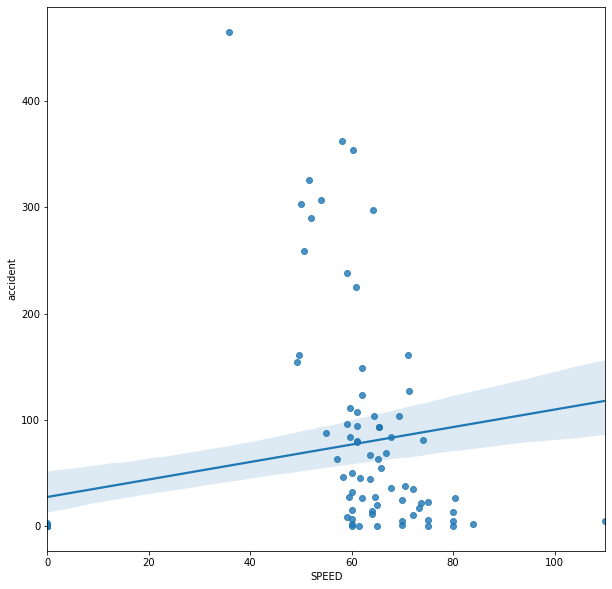

In [86]:
plt.figure(figsize = (10, 10))
speed_reg_plot = sns.regplot(x = 'SPEED', y = 'accident', data = incident_factors_speed)

Comment: The line of regression is positive indicating that higher speeds result in higher accident counts. Data is centralized around 40-80km/hr indicating most accidents happen in this speed range. 

### Average Speed vs. Traffic Accidents Point Plot

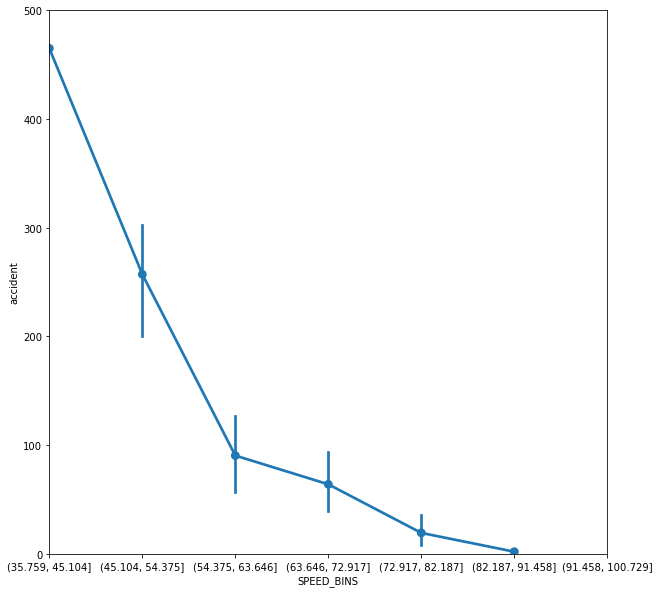

In [87]:
copy  = incident_factors_speed
copy.query('SPEED > 0', inplace = True)
copy.sort_values('accident')

plt.figure(figsize = (10, 10))
incident_factors_speed['SPEED_BINS'] = pd.cut(incident_factors_speed['SPEED'], bins = 8)
binned_plot = sns.pointplot(x = 'SPEED_BINS', y = 'accident', data = incident_factors_speed)
binned_plot = binned_plot.set(xlim=(0,6),ylim=(0,500))

Comment: There exists an outlier at ~35 km/hr, with a higher than normal accident count for that speed. This is due to an outlier point in grid 55, which is a urban road (16th Avenue by Sait) that has an accident count of 465.  Aside from the outlier, the rest of the line plot is consistent with our conclusion that most accidents occur in the speed range of 40 - 80 km/hr with this section taking the majority of the domain. 

In [15]:
incident_factors.loc[55]

minX                       51.027623
maxX                       51.064584
minY                     -114.087851
maxY                     -114.042261
accident                  465.000000
signals                   223.000000
cameras                    22.000000
SPEED                      35.833333
Average Speed Count        12.000000
VOLUME                  13595.419847
Average Volume Count      262.000000
Signs                   33465.000000
Name: 55, dtype: float64

### Speed Limit Histogram

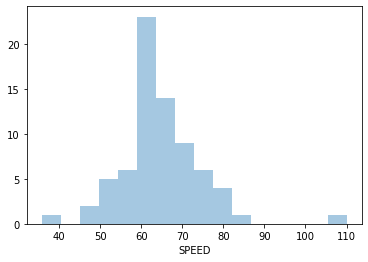

In [88]:
speed_hist = sns.distplot(incident_factors_speed['SPEED'], kde = False)

Comment: The histogram reinforces that the majority of speed limits in Calgary are between 60 - 80 km/h.  

# 2. Average Traffic Volume vs. Traffic Accidents

### Correlation Matrices

In [89]:
incident_factors_volume = incident_factors[['accident', 'VOLUME']]
traffic_coef = incident_factors_volume[['accident', 'VOLUME']].corr()

#### Correlation

In [91]:
display(traffic_coef)

,accident,VOLUME
accident,1.000000,0.620044
VOLUME,0.620044,1.000000


Comment: The regression coefficient is 0.62.  This indicates a strong, positive correlation between traffic volume and traffic accidents. 

### Average Traffic Volume vs. Traffic Accidents Boxplot

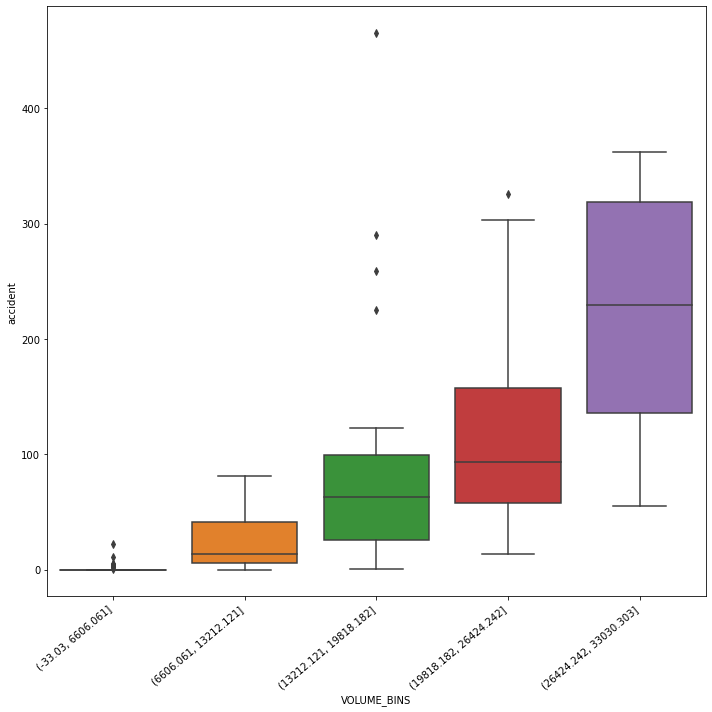

In [92]:
plt.figure(figsize = (10, 10))
incident_factors_volume['VOLUME_BINS'] = pd.cut(incident_factors_volume['VOLUME'], bins = 5)
traffic_box_plot = sns.boxplot(x = 'VOLUME_BINS', y = 'accident', data = incident_factors_volume)

traffic_box_plot.set_xticklabels(traffic_box_plot.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

Comment: The range of the largest volume has the highest range of accidents, and the middle 50% of it's data and the median is the highest compared to the other volume bins.  

### Traffic Volume vs. Traffic Accidents Regression Plot

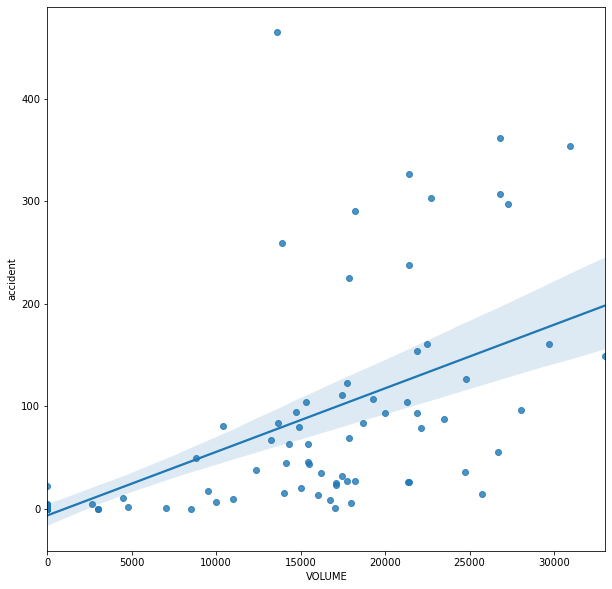

In [93]:
plt.figure(figsize = (10, 10))
traffic_reg_plot = sns.regplot(x = 'VOLUME', y = 'accident', data = incident_factors_volume)

Comment: The regression line slopes upward which is intuitive because as traffic volume increases, it leads to higher probability of accidents. 

# 3. Number of Traffic Cameras vs. Traffic Accidents

### Correlation Matrices

In [19]:
incident_factors_cameras = incident_factors[['accident', 'cameras']]
cameras_coef = incident_factors_cameras[['accident', 'cameras']].corr()

incident_factors_cameras['Grid'] = np.arange(0, len(incident_factors_cameras))

incident_factors_cameras

<ipython-input-19-f046c61cc7e3>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incident_factors_cameras['Grid'] = np.arange(0, len(incident_factors_cameras))


,accident,cameras,Grid
0,0,0,0
1,0,0,1
2,0,0,2
3,0,0,3
4,0,0,4
...,...,...,...
95,5,0,95
96,22,0,96
97,20,0,97
98,1,0,98


#### Correlation

In [96]:
display(cameras_coef)

,accident,cameras
accident,1.000000,0.846082
cameras,0.846082,1.000000


Comment: The correlation coefficient is 0.8461 which indicates a strong positive relationship between total grid cameras and accident.  

### Number of Traffic Cameras per Grid

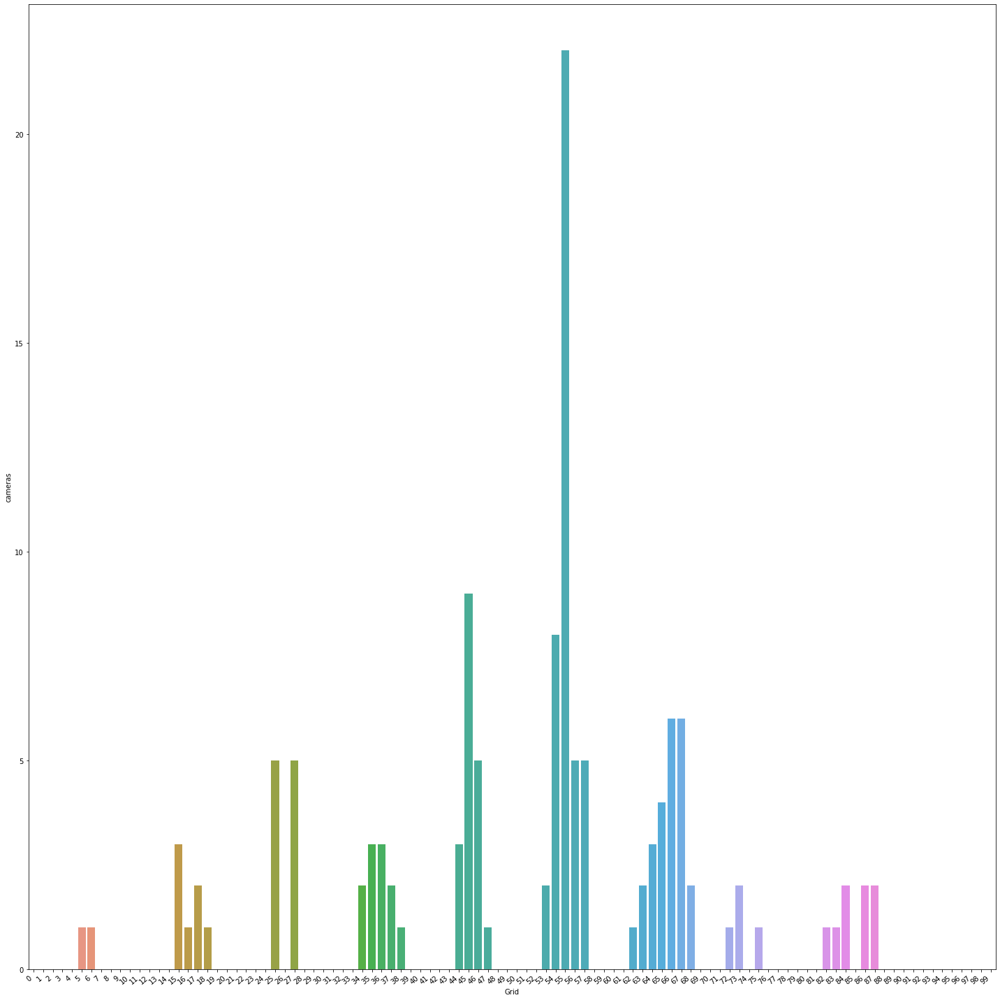

In [23]:
plt.figure(figsize = (20, 20))
cameras_bar_plot = sns.barplot(x = 'Grid', y = 'cameras', data = incident_factors_cameras)
cameras_bar_plot.set_xticklabels(cameras_bar_plot.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

Comment: This plot calculates the total number of cameras per city grid.  Grid 55 has the most traffic cameras in the city with 22 traffic cameras. 

### Number of Traffic Cameras vs. Traffic Accidents Regression Plot

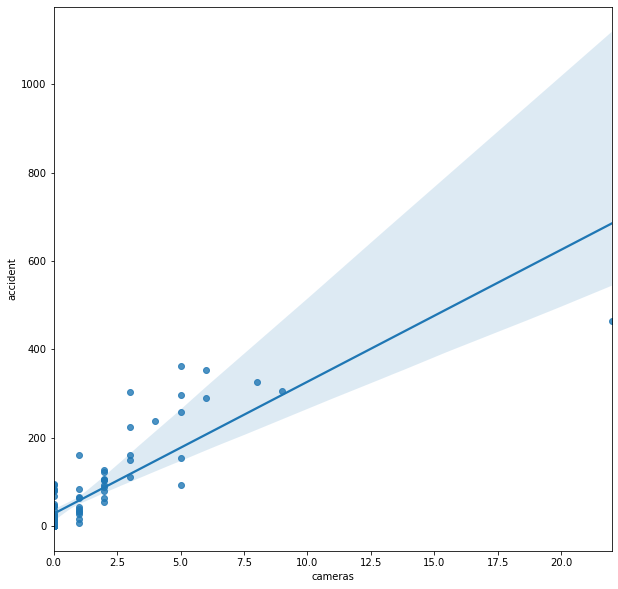

In [97]:
plt.figure(figsize = (10, 10))
cameras_reg_plot = sns.regplot(x = 'cameras', y = 'accident', data = incident_factors_cameras)

Comment: The regression plot reflects a positive correlation between number of traffic cameras and accident count.  Therefore grids with higher number of cameras have most accidents. Grids with higher cameras are typically located in higher traffic volume areas, therefore an increase in accident count can be contributed by either factors not necessarily cameras.   

### Average Number of Traffic Cameras vs. Traffic Accidents Line Plot

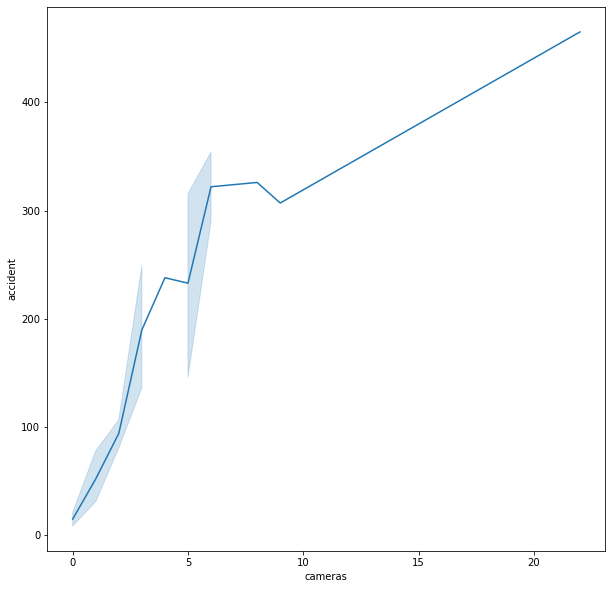

In [98]:
plt.figure(figsize = (10,10))
cameras_line_plot = sns.lineplot(x = 'cameras', y = 'accident', data = incident_factors_cameras)

Comment: Having more cameras should deter speeding and lead to less accidents, but in reality, the city places cameras in areas with high traffic volume.  Although there is a correlation, we believe that there are other factors such as traffic volume, weather, etc. that also have a positive correlation with accidents, therefore there is a correlation not a causation.

# 4. Average Number of Traffic Signals vs. Traffic Accidents

### Correlation Matrices

In [99]:
incident_factors_signals = incident_factors[['accident', 'signals']]
accident_coef = incident_factors_signals[['accident', 'signals']].corr()

#### Correlation

In [101]:
display(accident_coef)

,accident,signals
accident,1.000000,0.818475
signals,0.818475,1.000000


Comment: The correlation coefficient is 0.8185.  This indicates a very strong positive correlation between traffic signals and traffic accidents.

### Average Number of Traffic Signals vs. Traffic Accidents Regression Plot

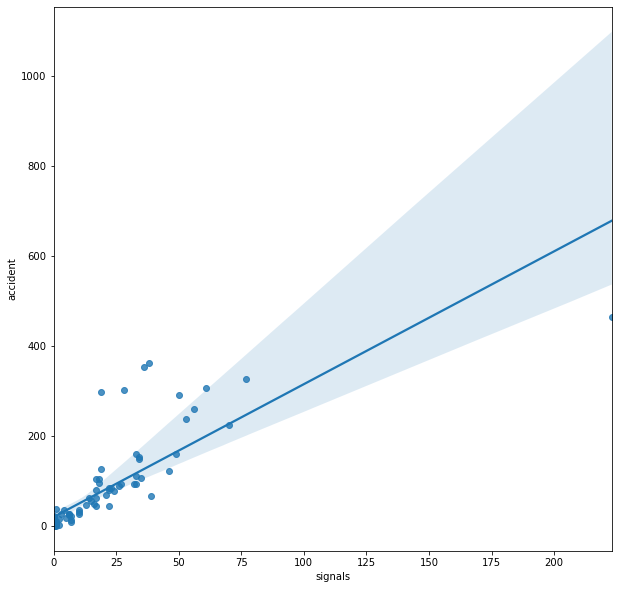

In [102]:
plt.figure(figsize = (10,10))
signals_reg_plot = sns.regplot(x = 'signals', y = 'accident', data = incident_factors_signals)

Comment: This is a positive correlation reflecting that higher number of signals correlates with a higher accident count. 

### Average Number of Traffic Signals vs. Traffic Accidents Line Plot

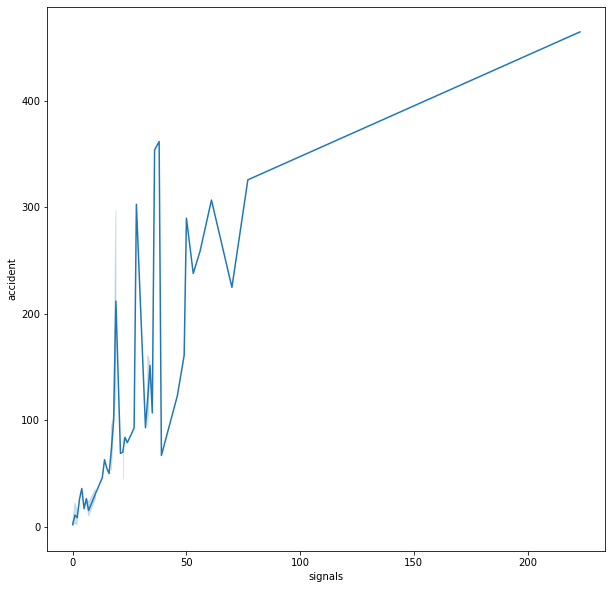

In [103]:
plt.figure(figsize = (10,10))
signals_line_plot = sns.lineplot(x = 'signals', y = 'accident', data = incident_factors_signals)

Comment: The greater amount of signals on the road typically leads to more accidents because an increase in the number of driver operations leads to a higher probability of driver error.

# 5. Number of Traffic Signs vs. Traffic Accidents

### Correlation Matrices

In [104]:
incident_factors_signs = incident_factors[['accident', 'Signs']]
signs_coef = incident_factors_signs[['accident', 'Signs']].corr()

#### Correlation

In [106]:
display(signs_coef)

,accident,Signs
accident,1.000000,0.757298
Signs,0.757298,1.000000


Comment: The correlation coefficient is 0.7573.  This indicates a very strong positive correlation between traffic signs and traffic accidents.

### Number of Traffic Signs vs. Traffic Accidents Regression Plot

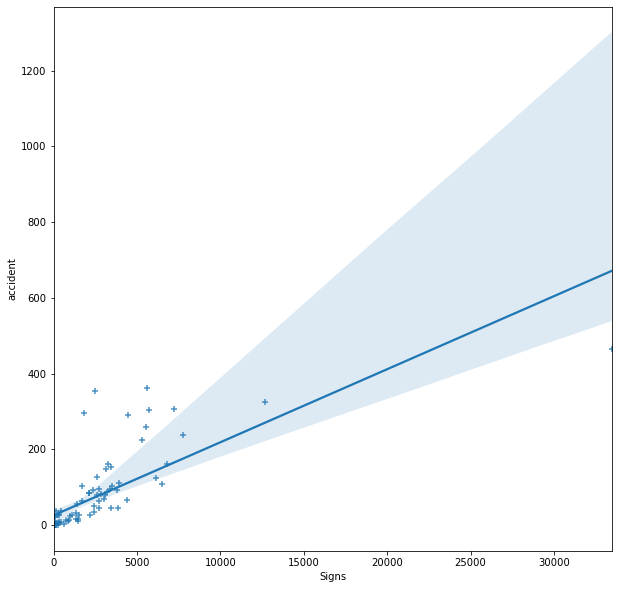

In [107]:
plt.figure(figsize = (10,10))
signs_reg_plot = sns.regplot(x = "Signs", y = 'accident', data = incident_factors_signs, marker = '+')

Comment:  This is a positive correlation reflecting that higher number of signs correlates with a higher accident count. 

### Number of Traffic Signs vs. Traffic Accidents Line Plot

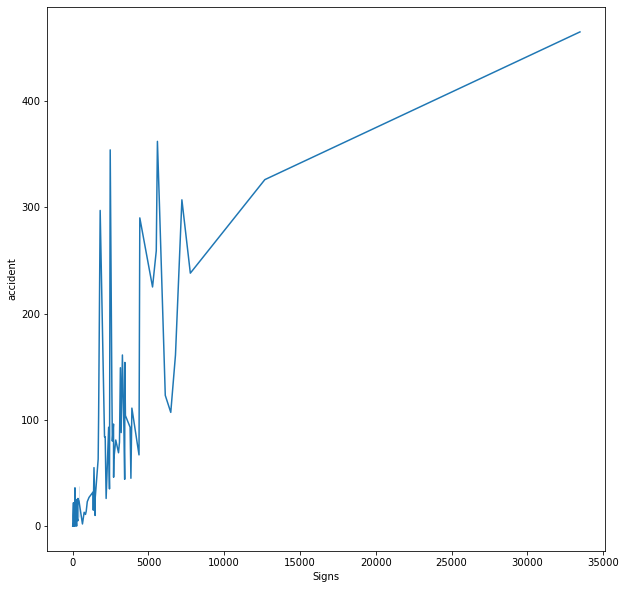

In [108]:
plt.figure(figsize = (10,10))
signs_line_plot = sns.lineplot(x = 'Signs', y = 'accident', data = incident_factors_signs)

Comment: Similar to signals, a greater number of signs typically requires more concentration, operations from the driver which leads to a higher probability of driver error and more accidents. 

# 6. Daily Weather Condition vs. Traffic Accidents

## A. Snowfall vs. Traffic Accidents

### Correlation Matrices

In [109]:
snow2_df = weather_combined[['Daily Accident Count', 'Total Snow (cm)']]
snowfall_coef = snow2_df[['Daily Accident Count', 'Total Snow (cm)']].corr()

#### Correlation

In [111]:
display(snowfall_coef)

,Daily Accident Count,Total Snow (cm)
Daily Accident Count,1.000000,0.349847
Total Snow (cm),0.349847,1.000000


Comment: The correlation coefficient is 0.3498.  This indicates a strong positive correlation between snowfall and traffic accidents.

### Snowfall vs. Traffic Accidents Regression Plot

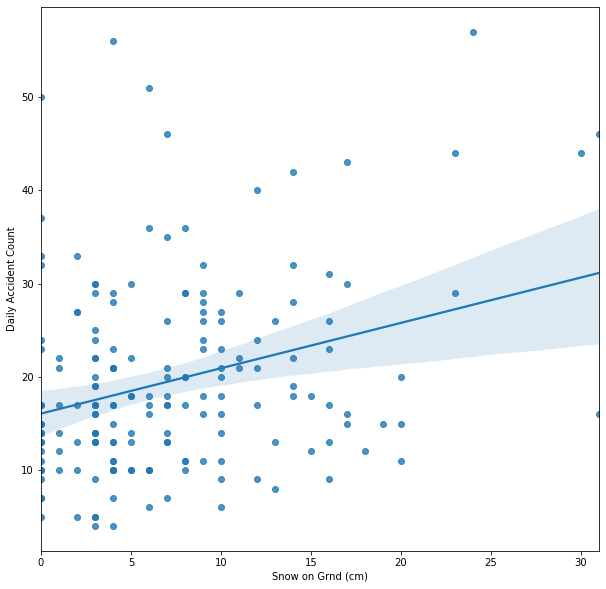

In [112]:
plt.figure(figsize = (10,10))
snow_reg_plot = sns.regplot(x = "Snow on Grnd (cm)", y = 'Daily Accident Count', data = weather_combined)

Comments: Correlation shows that more snow of the ground (cm) leads to higher daily accident counts.  

### Snowfall vs. Traffic Accidents Line Plot

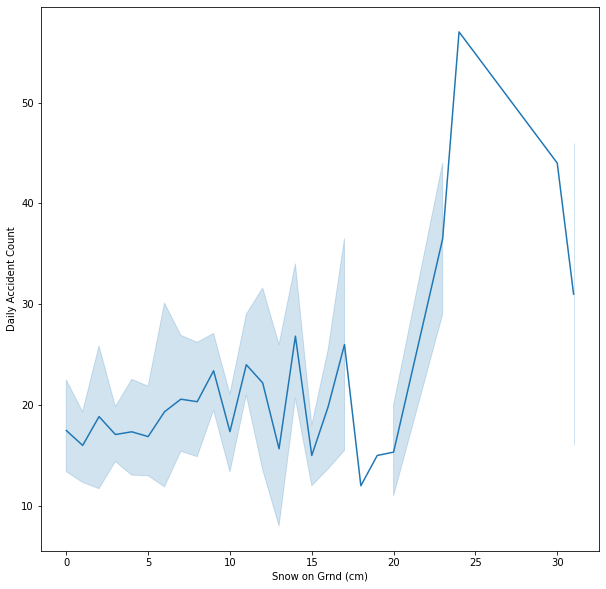

In [113]:
plt.figure(figsize = (10,10))
snow_line_plot = sns.lineplot(x = "Snow on Grnd (cm)", y = 'Daily Accident Count', data = weather_combined)

Comments: As snow on the ground surpasses 20 cm, there is a high spike in accidents reflecting more dangerous and difficult driving conditions.

##  B. Mean Temperature vs. Accident

### Correlation Matrices

In [114]:
temp_df = weather_combined[['Daily Accident Count', "Mean Temp (°C)"]]
temp_coef = temp_df[['Daily Accident Count', "Mean Temp (°C)"]].corr()

#### Correlation

In [116]:
display(temp_coef)

,Daily Accident Count,Mean Temp (°C)
Daily Accident Count,1.000000,-0.258297
Mean Temp (°C),-0.258297,1.000000


Comment: The correlation coefficient is -0.2383. This indicates a weak negative correlation between mean temperature and traffic accidents.

### Mean Temperature vs. Accident Regression Plot

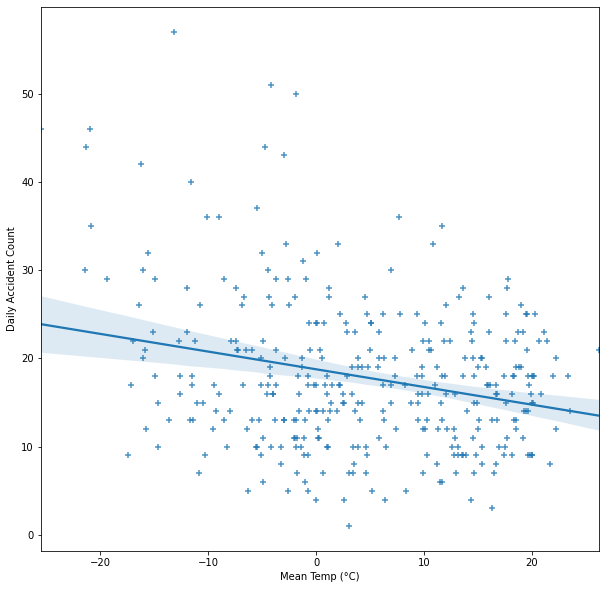

In [117]:
plt.figure(figsize = (10,10))
temp_reg_plot = sns.regplot(x = "Mean Temp (°C)", y = 'Daily Accident Count', data = weather_combined, marker = '+')

Comment: Colder temperatures yield more dangerous driving conditions (winter, ice) therefore the negative correlation makes sense.

## C. Visibility vs. Traffic Accidents

### Correlation Matrices

In [28]:
vis_df = weather_combined[['Daily Accident Count', "Visibility (km)"]]
vis_coef = vis_df[['Daily Accident Count', "Visibility (km)"]].corr()

#### Correlation

In [29]:
display(vis_coef)

,Daily Accident Count,Visibility (km)
Daily Accident Count,1.0000,-0.1593
Visibility (km),-0.1593,1.0000


Comment: The correlation coefficient is -0.1593.  This indicates a very weak negative correlation between visibility and traffic accidents.

### Visibility vs. Traffic Accidents Regression Plot

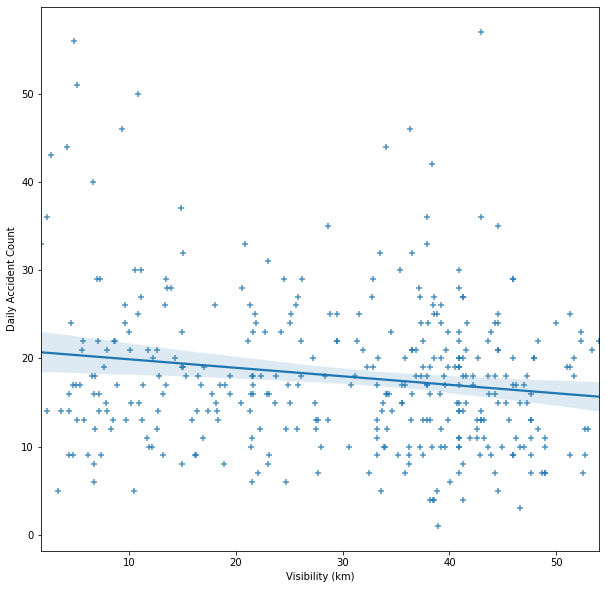

In [30]:
plt.figure(figsize = (10,10))
vis_reg_plot = sns.regplot(x = "Visibility (km)", y = 'Daily Accident Count', data = weather_combined, marker = '+')

Comment: Negative weak correlation between accident count and visibility. 

### Lowest Visibility (kms) Table and Highest Accident Count Table

In [33]:
accident_count = vis_df.sort_values('Daily Accident Count', ascending = False)
visibility_count = vis_df.sort_values('Visibility (km)', ascending = True)

display(accident_count.head(), visibility_count.head())

,Daily Accident Count,Visibility (km)
Date/Time,,
2018-02-12,57,42.908333
2018-02-03,56,4.834783
2018-03-15,51,5.108333
2018-11-23,50,10.812500
2018-02-09,46,36.283333


,Daily Accident Count,Visibility (km)
Date/Time,,
2018-04-12,33,1.758333
2018-08-15,14,2.316667
2018-03-02,36,2.350000
2018-10-02,43,2.666667
2018-12-26,5,3.316667


### Visibility vs. Traffic Accidents Histogram Plot

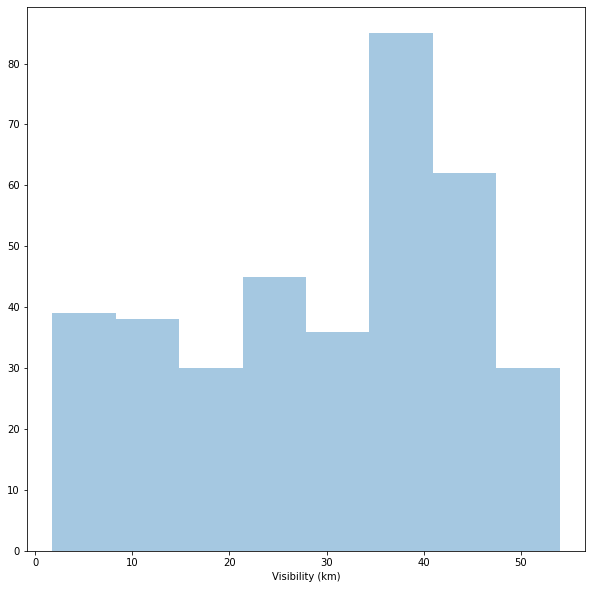

In [123]:
plt.figure(figsize = (10,10))
vis_hist = sns.distplot(vis_df['Visibility (km)'], kde = False)

Comment: No strong correlation between visibility and accident count. As shown by the histogram, the worst visibility experienced by drivers limits them to seeing < 1.76 kms ahead of them, which is sufficient space to drive safely. The scatter points wide range, along with the weak correlation factor, indicates no relationship between visibility and daily accident count.  

## Summary & Conclusion

### Correlation Matrix for Traffic Factors (Pearson Correlation)

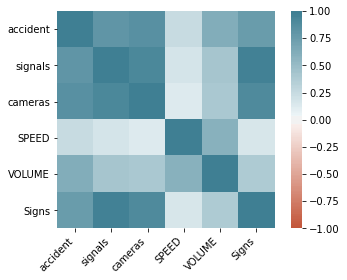

In [39]:
incident_factors_corr = incident_factors[['accident','signals','cameras','SPEED','VOLUME', 'Signs']]
incident_factors_corr = incident_factors_corr.corr()

corr = incident_factors_corr
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

Comment: The correlation matrix displays the relative correlation coefficients between factors, mainly each factor is compared with accident; however, there are positive correlations between factors (covariance) which confuses the correlation between some factors and accidents.  

For example, cameras are concentrated downtown, but additionally, downtown also experiences the highest traffic volumes therefore these two factors correlate with accident count, but we cannot separate how much each factor individually contributes to accident count. 

### Correlation Matrix for Weather Factors

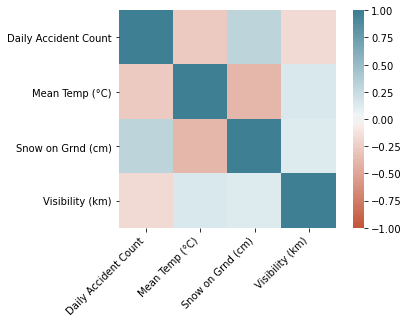

In [24]:
weather_factors_corr = weather_combined[['Daily Accident Count', 'Mean Temp (°C)','Snow on Grnd (cm)','Visibility (km)']]
weather_factors_corr = weather_factors_corr.corr()

corr = weather_factors_corr
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

Comment: The correlation matrix shows that for weather factors, only snow on ground has a positive correlation with daily accident count, while mean temp and visibility have negative correlations.  This is intuitive because as mean temp increases, driving conditions become easier, and as visibility increases, drivers can see further ahead resulting in safer driving and lower accident count.  

### Conclusion - Weather Factors

Out of the weather factors, we believe Snow on Ground and Mean Temp have the largest influences on accident count.  

Snow on Ground has a coefficient of 0.3498 showing that as more snow accumulates on the road surface, there are a higher amount of accidents. And as snow on the ground surpasses 20 cm, the line graph shows that there is a high spike in accidents which reflects the dangerous and difficult driving conditions.

Mean Temp is the second strongest weather factor and has a coefficient of -0.2583 indicating an inverse relationship between temperature and accidents. This is intuitive. As outside temperatures grow warmer, driving conditions become safer.  And inversely, as winter approaches and temperatures grow colder, ice forms easier, visibility typically decreases, and the general driving environment becomes more dangerous. 

Visibility is the weakest magnitude weather factor and has a coefficient of -0.1593 indicating an inverse relationship between visibility and accidents.  Visibility is measured in kilometres and gives a metric for how far a driver can see when driving. The visibility histogram shows the distribution of the visibility data and it reflects that most the datapoints lay between 35-45 kms of visibility, which means that in a given year, most days have great visibility. After sorting the dataframe and sorting by visibility, we see that in fact days with less visibility due in general lead to higher accident counts; however, on the least visible day, drivers can still see 1.75kms ahead of them which although unsafe is still drivable.  The strongest argument against using visibility as an accident factor is highlighted when examining the sorted table of highest accident counts. Here we see that the highest accident counts occur at different points of the visibility range (ie. 42.91 km, 4.83km, 5.11km, 10.81km, 36.38 km), therefore the most dangerous areas with the highest accident counts seemingly don't have a correlation.  

Daily Accident Count	Visibility (km)
Date/Time		
2018-02-12	57	42.908333
2018-02-03	56	4.834783
2018-03-15	51	5.108333
2018-11-23	50	10.812500
2018-02-09	46	36.283333

### Conclusion - Traffic Factors

Out of the accident factors, the Pearson correlation between each factor (speed, volume, signals, signs, cameras) and accident count are all positive and strong as shown by the Traffic Factor correlation matrix above. Due to the covariance between traffic factors, pinpointing causal relationships between each factor and accident count is difficult and requires more statistical analysis; however, we believe there are still a few conclusions to be made. 

Average speed is the smallest magnitude traffic factor and has a coefficient of 0.252.  The scatterplot shows a line of regression that is positive indicating that higher speeds result in higher accident counts; however, the data is not uniformly distributed and is mostly centralized around 40-80km/hr indicating that most accidents happen in this speed range and not at higher speeds. This makes sense because urban areas (like downtown) make up the majority of the roads, the roads are all <80 km/h, and the majority of accidents occur in the city as shown by the sorted table accident count per grid.  

Total Cameras per Grid has one of the strongest correlating factors with accidents, and has a coefficient of 0.846. By plotting the total number of cameras per grid, we were able to determine that grids located closer to downtown had the highest camera count. This is significant because, although the scatter plot gives a strong positive correlation, the accidents are being recorded in downtown where there is higher traffic volume, speeds between 40-80 km/h, more traffic signals and signs - all factors that also have a strong positive correlation with accident count. This does not mean that cameras don't truly affect accidents, but rather it means that cameras along with other factors are causing higher accidents, and it is not solely cameras as a factor causing an increas in accident count.  

Average Traffic Volume has a correlating coefficient of 0.62. Although it isn't the largest correlating factor with accident count, it is the most convincing.  Evidence that supports this statement is the traffic volume boxplot which separates volume into 5 distinct ranges and reflects how each range affects accident count.  The highest volume bin of the boxplot clearly shows that areas with high traffic volume consistently lead to higher accident counts due to having the widest range and median out of all volume bins. Additionally, unlike the scatterplots of other factors, the traffic volume scatter points surround the line of regression for the whole domain, rather than only a section of it.  Consistently showing an increase in accidents as volume increases, rather than the trend being driven by a few outliers at the end of the domain. 

Average Traffic Signals and Average Traffic Signs have correlating coefficients of 0.8185 and 0.7573. Both are strong, well-fit correlations as shown by their scatterplots; however, again, there is a co-variance problem because areas with more signs and signals typically are in urban settings with factors like speed, volume, cameras, etc. which also contribute to higher accident counts.  But on the other hand, it is plausible and likely that the greater amount of signals and signs on the road typically lead to more accidents because an increase in the number of driver operations leads to a higher probability of driver error.